## Time Series Forecasting to Predict Number of Scrap Tire That will Received at ATD Tire Distribution Centers on a day

**Importing Necessary Packages**

In [1]:
import numpy as np
import pandas as pd
from prophet import Prophet
import datetime
import math as ma
import itertools
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from scipy import signal
import seaborn as sns
import matplotlib.pyplot as plt
import dtale as dtl
import warnings
warnings.filterwarnings("ignore")
#!pip install prophet
#!pip install dtale

**By looking at following data, it seems we have number of different locations of ATD distribution center. The retail price of scrap tires at the distribution center varies on a day to day basis. As we need to predict the number of scrap tires on a given day therefore the retail price trend of the scrap tire will be a depending factor here. We also need to see if any other variables such as day of the week, holidays etc has any effect on our dependent variable or not. If size_code or zip_code has to do anything with the dependent variable or not as well.**

In [2]:
data = pd.read_csv('ATD_train_data.csv')
data['date'] = pd.to_datetime(data.date)
data.head()

,date,dc_name,size_code,retail_price,total_tires,zip_code
0,2022-02-05,OAKLAND,1856015,70.090,1,94604
1,2021-03-02,OAKLAND,1856015,59.090,1,94604
2,2020-12-08,OAKLAND,1856015,53.545,1,94604
3,2022-01-17,OAKLAND,1856015,58.410,1,94604
4,2020-11-13,OAKLAND,1856015,43.085,1,94604


In [3]:
data = data.sort_values(by=['dc_name','size_code','date'])

### Performing EDA to extract required information that might be helpful for Time Series Modeling

**Finding out the number of Missing Data**

In [4]:
data.isnull().sum()

date             0
dc_name          0
size_code        0
retail_price    34
total_tires      0
zip_code         0
dtype: int64

**As this is a time series data, therefore using back fill method to update missing reatil price cases. That is updating the price based on Previous day's price for missing cases.**

In [5]:
#data[data.retail_price.isnull()==True]
##data[data.dc_name=="SACRAMENTO"].retail_price.mean()

data.retail_price.fillna(method='bfill',inplace=True)

**How many different DC/Location we have?**<br>
4 diferent DC

In [6]:
data.dc_name.value_counts()

SACRAMENTO     113150
BAKERSFIELD     76650
OAKLAND         59860
SAN JOSE        35040
Name: dc_name, dtype: int64

**Does the number of tires vary across different Locations?**<br>
- seems like Bakers field has the higest number of outlier cases.
- also every location has a diferent spread of receiving number of scrap tires.

This suggest that for different location we have to build different forecasting model.

Text(0.5, 1.0, 'Spread of Total Tiers w/o Outliers')

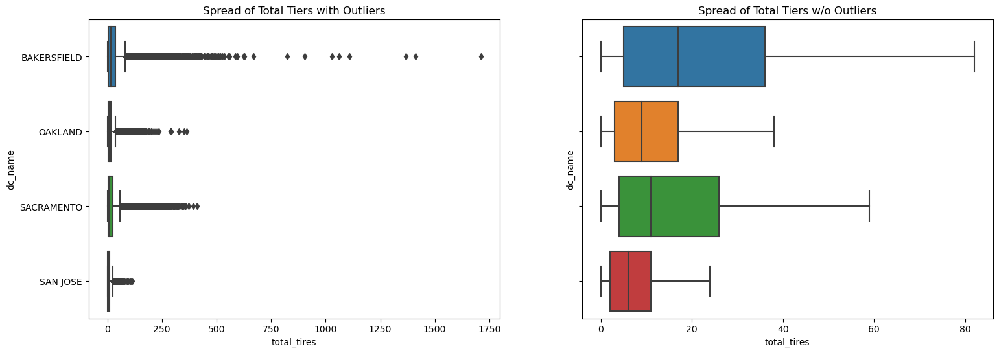

In [7]:
fig, ax = plt.subplots(1,2, figsize=(18,6), sharey=True)

sns.boxplot(data,x='total_tires',y='dc_name', ax=ax[0])
sns.boxplot(data,x='total_tires',y='dc_name', ax=ax[1], showfliers=False)
ax[0].set_title("Spread of Total Tiers with Outliers")
ax[1].set_title("Spread of Total Tiers w/o Outliers")

**Does the retail price vary across different Locations?**
- the price at different locations has a similar 1st to 3rd quartile spread but the upper whisker especially fo San Jose is pretty high.
- lets visualize the price with a line graph for different locations to understand better.

Text(0.5, 1.0, 'Spread of Retail Price w/o Outliers')

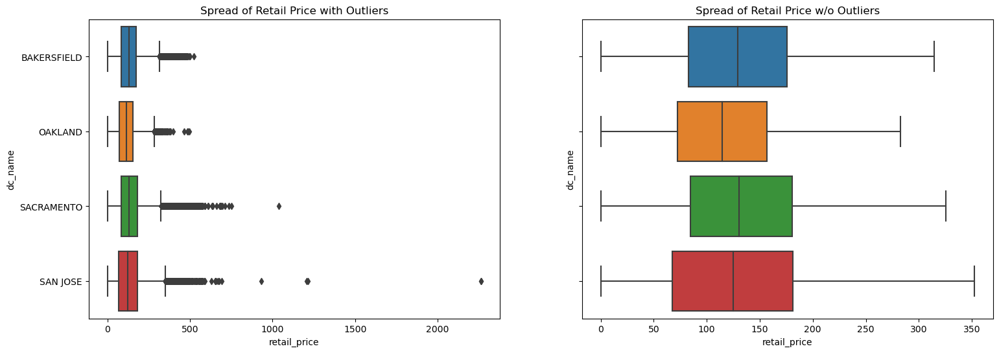

In [8]:
fig, ax = plt.subplots(1,2, figsize=(18,6), sharey=True)

sns.boxplot(data,x='retail_price',y='dc_name', ax=ax[0])
sns.boxplot(data,x='retail_price',y='dc_name', ax=ax[1], showfliers=False)
ax[0].set_title("Spread of Retail Price with Outliers")
ax[1].set_title("Spread of Retail Price w/o Outliers")

By zooming on a particular period we realize that the retail price can vary on a particular day and can have different minimum maximum values across regions.

This confirms that for every different region. we will need a different forecast model which will **take into account the retail price as a regressor**. Also if any other regressors are necessary.

In [9]:
import plotly.express as px

x=pd.Timestamp('2021-03-01')
y=pd.Timestamp('2022-03-01')
temp_df = data[(data.date>=x) & (data.date<=y)].sort_values(by='date')
fig = px.line(temp_df, x='date', y='retail_price',color='dc_name')
fig.show()
del temp_df
del x 
del y

By analyzing the data on a day by day basis at different locations, we found that different size codes has different prices. Let's see if for any random particular size how the price differs at location to location.<br>

By using plotly zoom features, also a seasonal pattern is getting more visible here where the **price drops after every 7 days. Those are sundays**. That indicates, sundays there is no business. <br>
Beside every sunday, there is also a **dip sometimes in between the weeks, those seems holidays** such as Thanks Giving, New year etc.

In [10]:
##using DTL a more detailed data analysis can be performed with ease

#dtl.show(data).open_browser()

In [11]:
fig = px.line(data.query('size_code==2055516').sort_values(by='date'), x='date', y='retail_price',color='dc_name')
fig.show()

In [12]:
fig = px.line(data.query('size_code==2055516').sort_values(by='date'), x='date', y='total_tires',color='dc_name')
fig.show()

**In the following box plot, it can be seen that the number of scrap tires received at different locations vary slightly within the range of the 1st-3rd quartile. But a notable variance is there at the upper whisker especially for BaskerField.<br>
As seen earlier in line plot, for Sunday, there is no data at all.<br>
It will be more interesting to visualize how this pattern varies for different size of the tires.**

In [13]:
data['dayofweek'] = data.date.dt.weekday

Text(0.5, 1.0, 'Day of the Week for Total Tiers w/o Outliers')

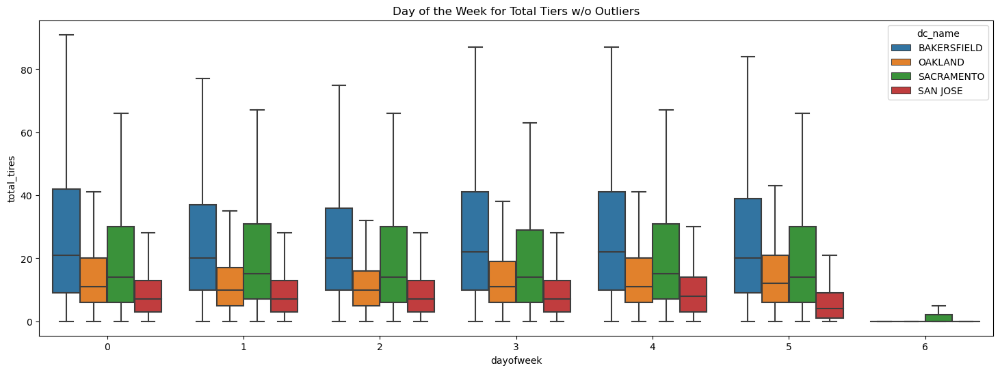

In [14]:
fig, ax = plt.subplots(1,1, figsize=(18,6))

sns.boxplot(data,y='total_tires',x='dayofweek', ax=ax, hue='dc_name',showfliers=False)
ax.set_title("Day of the Week for Total Tiers w/o Outliers")

In the followng 3-D plot, radomly three different size of tire has been randomly chosen to visualize the variton in the total number of tires over day of the week. It can be seen that for a given size, the number of tires varies notably on day of the week for a given location. It indicates diferent day of the week can be used as a regressor in our modelling.

In [23]:
import plotly.express as px

data['size_code_str'] = data['size_code'].astype('str')

fig = px.scatter_3d(data.query("size_code in (1856015,3512518,2056016)"), x='dayofweek', y='size_code_str', z='total_tires',
              color='dc_name')
fig.show()

**Therefore we can say that in order to properly forecast how many scrap tires will be received, we not only need to consider the different locations, but also its different sizes.<br>
We have to build different time series as per location and size of the tire to make better prediction.<br>
Not to mention even the days of the week is also important along with holidays.**

Normalizing the price of the tires by follwing a standardization technique. This way we will be able to account for the outliers present in our data see earlier. We are not removing the outliers in this case as those data points can be important in the overall forecast.

In [16]:
data['retail_price_norm'] = (data['retail_price'] - data['retail_price'].mean()) / data['retail_price'].std()

**The following code cell thus encodes the specific holidays on which the variation was noticed. Holiday data was encoded following Prophet's modelling requirements. Mentioning the pre effect of holiday to be 2 days beofore and after effect to be 5 days.** 

In [17]:
holidays = pd.DataFrame({
    'holiday' : 'events',
    'ds' : pd.to_datetime(['2020-11-25','2021-11-25','2022-11-25',
                          '2020-09-06','2021-09-06','2022-09-06',
                          '2020-07-04','2021-07-04','2022-07-04',
                          '2020-12-25','2021-12-25','2020-05-31',
                          '2021-05-31','2022-05-31']),
    'lower_window' : -2,
    'upper_window': 5,
})

**Defining a function to run forecast model for each location and each tire size code**

In [18]:
def get_ts(data, dc_name, size_code):
    ts = data.loc[(data.dc_name == dc_name) & (data.size_code == size_code)].copy()\
            [['date','total_tires','retail_price_norm']]
    ts = ts.rename(columns = {'date':'ds','total_tires':'y'}).sort_values(by='ds')
    return ts

Testing the function

In [19]:
temp = get_ts(data,'OAKLAND',1856015)
temp.loc[temp.ds >= datetime.datetime(2022, 9, 13)]

,ds,y,retail_price_norm
156,2022-09-13,3,-0.718958
151,2022-09-14,3,-0.747787
404,2022-09-15,8,-0.495824
520,2022-09-16,15,-0.291889
71,2022-09-17,2,-0.718958
236838,2022-09-18,0,-1.529029
68,2022-09-19,2,-0.912897


**Defining a function to confirm if it is a Sunday or Not. It was found that using day of the week provides a better model performance. Thus commenting out the function.**

In [20]:
# def sunday(ds):
#     date = pd.to_datetime(ds)
#     if date.weekday() == 6:
#         return 1
#     else:
#         return 0

**Get list of all the different location and size of the tires being sold at that location**

In [21]:
temp_list = data[['dc_name','size_code']]
unique_location_size = temp_list[~temp_list.duplicated(keep='first')]
unique_location_size = unique_location_size.reset_index()  

In [22]:
unique_location_size.shape

(390, 3)

**Build a separate copy of the data to hold the predictions**

In [24]:
data_copy = data.copy()

### Build a loop to run through every cases. The loop will run 390 times and the model will be trained on every location with a different tire size to make predictions.
**As we have to predict for the next week, therefore we are are going to keep the next 7 days as out-of-sample. From above graph it was noticed that we had data upto September 19th, 2023. Thus we will train the model on data upto 12th September 2023 and keep the rest as a test set.**

In [25]:
import logging
logging.getLogger('fbprophet').setLevel(logging.WARNING) 

In [26]:
y_true = []
y_pred = []


for i in range(0,len(unique_location_size)):
    
    dc_name = unique_location_size.loc[i,'dc_name']
    size_code = unique_location_size.loc[i,'size_code']
    
    if i%10 == 0:
        print(f"Building model {i} for {dc_name}, {size_code}")
    
    subset = get_ts(data, dc_name, size_code).reset_index(drop=True)
    subset = subset.sort_values(by='ds')
    split = datetime.datetime(2022, 9, 13)
    
    # Add sunday
    #subset['is_sunday'] = subset['ds'].apply(sunday)
    subset['dayofweek'] = subset['ds'].dt.weekday

    # Train
    train_df = subset.loc[subset.ds < split]
    #model = Prophet()    
    #model.add_seasonality(name='weekly', period=1, fourier_order=3, changepoint_prior_scale=0.3)

    model = Prophet(changepoint_prior_scale=0.1, seasonality_prior_scale=1.5, holidays = holidays)
    #model = Prophet(changepoint_prior_scale=0.1)
    model.add_regressor('dayofweek')
    model.add_regressor('retail_price_norm')
    
    model.fit(train_df)

    # Test
    test_df = subset.loc[subset.ds >= split]
    future = test_df[['ds','dayofweek','retail_price_norm']]

    #future
    forecast = model.predict(future)[['ds','yhat']]
    forecast['yhat'] = forecast.yhat.clip(lower=0).round().astype(int)
    
    y_true.extend(test_df.y.tolist())
    y_pred.extend(forecast.yhat.tolist())
    
    for i in range(0,len(forecast)):
        forecast_ds = forecast.loc[i,'ds']
        predicted_val = forecast.loc[i,'yhat']
        data_copy.loc[((data_copy.dc_name==dc_name) 
                       & (data_copy.size_code==size_code)
                       & (data_copy.date==forecast_ds))
                      ,'tire_pred'] = predicted_val

12:22:09 - cmdstanpy - INFO - Chain [1] start processing
12:22:09 - cmdstanpy - INFO - Chain [1] done processing


Building model 0 for BAKERSFIELD, 1856015


12:22:09 - cmdstanpy - INFO - Chain [1] start processing
12:22:09 - cmdstanpy - INFO - Chain [1] done processing
12:22:10 - cmdstanpy - INFO - Chain [1] start processing
12:22:10 - cmdstanpy - INFO - Chain [1] done processing
12:22:10 - cmdstanpy - INFO - Chain [1] start processing
12:22:10 - cmdstanpy - INFO - Chain [1] done processing
12:22:11 - cmdstanpy - INFO - Chain [1] start processing
12:22:11 - cmdstanpy - INFO - Chain [1] done processing
12:22:11 - cmdstanpy - INFO - Chain [1] start processing
12:22:11 - cmdstanpy - INFO - Chain [1] done processing
12:22:11 - cmdstanpy - INFO - Chain [1] start processing
12:22:11 - cmdstanpy - INFO - Chain [1] done processing
12:22:12 - cmdstanpy - INFO - Chain [1] start processing
12:22:12 - cmdstanpy - INFO - Chain [1] done processing
12:22:12 - cmdstanpy - INFO - Chain [1] start processing
12:22:12 - cmdstanpy - INFO - Chain [1] done processing
12:22:13 - cmdstanpy - INFO - Chain [1] start processing
12:22:13 - cmdstanpy - INFO - Chain [1]

Building model 10 for BAKERSFIELD, 2056516


12:22:13 - cmdstanpy - INFO - Chain [1] start processing
12:22:13 - cmdstanpy - INFO - Chain [1] done processing
12:22:14 - cmdstanpy - INFO - Chain [1] start processing
12:22:14 - cmdstanpy - INFO - Chain [1] done processing
12:22:14 - cmdstanpy - INFO - Chain [1] start processing
12:22:14 - cmdstanpy - INFO - Chain [1] done processing
12:22:15 - cmdstanpy - INFO - Chain [1] start processing
12:22:15 - cmdstanpy - INFO - Chain [1] done processing
12:22:15 - cmdstanpy - INFO - Chain [1] start processing
12:22:15 - cmdstanpy - INFO - Chain [1] done processing
12:22:15 - cmdstanpy - INFO - Chain [1] start processing
12:22:15 - cmdstanpy - INFO - Chain [1] done processing
12:22:16 - cmdstanpy - INFO - Chain [1] start processing
12:22:16 - cmdstanpy - INFO - Chain [1] done processing
12:22:16 - cmdstanpy - INFO - Chain [1] start processing
12:22:16 - cmdstanpy - INFO - Chain [1] done processing
12:22:17 - cmdstanpy - INFO - Chain [1] start processing
12:22:17 - cmdstanpy - INFO - Chain [1]

Building model 20 for BAKERSFIELD, 2156016


12:22:17 - cmdstanpy - INFO - Chain [1] start processing
12:22:17 - cmdstanpy - INFO - Chain [1] done processing
12:22:18 - cmdstanpy - INFO - Chain [1] start processing
12:22:18 - cmdstanpy - INFO - Chain [1] done processing
12:22:18 - cmdstanpy - INFO - Chain [1] start processing
12:22:18 - cmdstanpy - INFO - Chain [1] done processing
12:22:18 - cmdstanpy - INFO - Chain [1] start processing
12:22:19 - cmdstanpy - INFO - Chain [1] done processing
12:22:19 - cmdstanpy - INFO - Chain [1] start processing
12:22:19 - cmdstanpy - INFO - Chain [1] done processing
12:22:19 - cmdstanpy - INFO - Chain [1] start processing
12:22:19 - cmdstanpy - INFO - Chain [1] done processing
12:22:20 - cmdstanpy - INFO - Chain [1] start processing
12:22:20 - cmdstanpy - INFO - Chain [1] done processing
12:22:20 - cmdstanpy - INFO - Chain [1] start processing
12:22:20 - cmdstanpy - INFO - Chain [1] done processing
12:22:20 - cmdstanpy - INFO - Chain [1] start processing
12:22:20 - cmdstanpy - INFO - Chain [1]

Building model 30 for BAKERSFIELD, 2255018


12:22:21 - cmdstanpy - INFO - Chain [1] start processing
12:22:21 - cmdstanpy - INFO - Chain [1] done processing
12:22:22 - cmdstanpy - INFO - Chain [1] start processing
12:22:22 - cmdstanpy - INFO - Chain [1] done processing
12:22:22 - cmdstanpy - INFO - Chain [1] start processing
12:22:22 - cmdstanpy - INFO - Chain [1] done processing
12:22:22 - cmdstanpy - INFO - Chain [1] start processing
12:22:22 - cmdstanpy - INFO - Chain [1] done processing
12:22:23 - cmdstanpy - INFO - Chain [1] start processing
12:22:23 - cmdstanpy - INFO - Chain [1] done processing
12:22:23 - cmdstanpy - INFO - Chain [1] start processing
12:22:23 - cmdstanpy - INFO - Chain [1] done processing
12:22:23 - cmdstanpy - INFO - Chain [1] start processing
12:22:24 - cmdstanpy - INFO - Chain [1] done processing
12:22:24 - cmdstanpy - INFO - Chain [1] start processing
12:22:24 - cmdstanpy - INFO - Chain [1] done processing
12:22:24 - cmdstanpy - INFO - Chain [1] start processing
12:22:24 - cmdstanpy - INFO - Chain [1]

Building model 40 for BAKERSFIELD, 2257515


12:22:25 - cmdstanpy - INFO - Chain [1] start processing
12:22:25 - cmdstanpy - INFO - Chain [1] done processing
12:22:26 - cmdstanpy - INFO - Chain [1] start processing
12:22:26 - cmdstanpy - INFO - Chain [1] done processing
12:22:26 - cmdstanpy - INFO - Chain [1] start processing
12:22:26 - cmdstanpy - INFO - Chain [1] done processing
12:22:26 - cmdstanpy - INFO - Chain [1] start processing
12:22:26 - cmdstanpy - INFO - Chain [1] done processing
12:22:27 - cmdstanpy - INFO - Chain [1] start processing
12:22:27 - cmdstanpy - INFO - Chain [1] done processing
12:22:27 - cmdstanpy - INFO - Chain [1] start processing
12:22:27 - cmdstanpy - INFO - Chain [1] done processing
12:22:27 - cmdstanpy - INFO - Chain [1] start processing
12:22:27 - cmdstanpy - INFO - Chain [1] done processing
12:22:28 - cmdstanpy - INFO - Chain [1] start processing
12:22:28 - cmdstanpy - INFO - Chain [1] done processing
12:22:28 - cmdstanpy - INFO - Chain [1] start processing
12:22:28 - cmdstanpy - INFO - Chain [1]

Building model 50 for BAKERSFIELD, 2355517


12:22:29 - cmdstanpy - INFO - Chain [1] start processing
12:22:29 - cmdstanpy - INFO - Chain [1] done processing
12:22:29 - cmdstanpy - INFO - Chain [1] start processing
12:22:29 - cmdstanpy - INFO - Chain [1] done processing
12:22:30 - cmdstanpy - INFO - Chain [1] start processing
12:22:30 - cmdstanpy - INFO - Chain [1] done processing
12:22:30 - cmdstanpy - INFO - Chain [1] start processing
12:22:30 - cmdstanpy - INFO - Chain [1] done processing
12:22:31 - cmdstanpy - INFO - Chain [1] start processing
12:22:31 - cmdstanpy - INFO - Chain [1] done processing
12:22:31 - cmdstanpy - INFO - Chain [1] start processing
12:22:31 - cmdstanpy - INFO - Chain [1] done processing
12:22:31 - cmdstanpy - INFO - Chain [1] start processing
12:22:31 - cmdstanpy - INFO - Chain [1] done processing
12:22:32 - cmdstanpy - INFO - Chain [1] start processing
12:22:32 - cmdstanpy - INFO - Chain [1] done processing
12:22:32 - cmdstanpy - INFO - Chain [1] start processing
12:22:32 - cmdstanpy - INFO - Chain [1]

Building model 60 for BAKERSFIELD, 2357016


12:22:33 - cmdstanpy - INFO - Chain [1] start processing
12:22:33 - cmdstanpy - INFO - Chain [1] done processing
12:22:33 - cmdstanpy - INFO - Chain [1] start processing
12:22:33 - cmdstanpy - INFO - Chain [1] done processing
12:22:34 - cmdstanpy - INFO - Chain [1] start processing
12:22:34 - cmdstanpy - INFO - Chain [1] done processing
12:22:34 - cmdstanpy - INFO - Chain [1] start processing
12:22:34 - cmdstanpy - INFO - Chain [1] done processing
12:22:34 - cmdstanpy - INFO - Chain [1] start processing
12:22:34 - cmdstanpy - INFO - Chain [1] done processing
12:22:35 - cmdstanpy - INFO - Chain [1] start processing
12:22:35 - cmdstanpy - INFO - Chain [1] done processing
12:22:35 - cmdstanpy - INFO - Chain [1] start processing
12:22:35 - cmdstanpy - INFO - Chain [1] done processing
12:22:36 - cmdstanpy - INFO - Chain [1] start processing
12:22:36 - cmdstanpy - INFO - Chain [1] done processing
12:22:36 - cmdstanpy - INFO - Chain [1] start processing
12:22:36 - cmdstanpy - INFO - Chain [1]

Building model 70 for BAKERSFIELD, 2454519


12:22:37 - cmdstanpy - INFO - Chain [1] start processing
12:22:37 - cmdstanpy - INFO - Chain [1] done processing
12:22:37 - cmdstanpy - INFO - Chain [1] start processing
12:22:37 - cmdstanpy - INFO - Chain [1] done processing
12:22:37 - cmdstanpy - INFO - Chain [1] start processing
12:22:37 - cmdstanpy - INFO - Chain [1] done processing
12:22:38 - cmdstanpy - INFO - Chain [1] start processing
12:22:38 - cmdstanpy - INFO - Chain [1] done processing
12:22:38 - cmdstanpy - INFO - Chain [1] start processing
12:22:38 - cmdstanpy - INFO - Chain [1] done processing
12:22:39 - cmdstanpy - INFO - Chain [1] start processing
12:22:39 - cmdstanpy - INFO - Chain [1] done processing
12:22:39 - cmdstanpy - INFO - Chain [1] start processing
12:22:39 - cmdstanpy - INFO - Chain [1] done processing
12:22:39 - cmdstanpy - INFO - Chain [1] start processing
12:22:39 - cmdstanpy - INFO - Chain [1] done processing
12:22:40 - cmdstanpy - INFO - Chain [1] start processing
12:22:40 - cmdstanpy - INFO - Chain [1]

Building model 80 for BAKERSFIELD, 2554519


12:22:40 - cmdstanpy - INFO - Chain [1] start processing
12:22:40 - cmdstanpy - INFO - Chain [1] done processing
12:22:41 - cmdstanpy - INFO - Chain [1] start processing
12:22:41 - cmdstanpy - INFO - Chain [1] done processing
12:22:41 - cmdstanpy - INFO - Chain [1] start processing
12:22:41 - cmdstanpy - INFO - Chain [1] done processing
12:22:42 - cmdstanpy - INFO - Chain [1] start processing
12:22:42 - cmdstanpy - INFO - Chain [1] done processing
12:22:42 - cmdstanpy - INFO - Chain [1] start processing
12:22:42 - cmdstanpy - INFO - Chain [1] done processing
12:22:42 - cmdstanpy - INFO - Chain [1] start processing
12:22:42 - cmdstanpy - INFO - Chain [1] done processing
12:22:43 - cmdstanpy - INFO - Chain [1] start processing
12:22:43 - cmdstanpy - INFO - Chain [1] done processing
12:22:43 - cmdstanpy - INFO - Chain [1] start processing
12:22:43 - cmdstanpy - INFO - Chain [1] done processing
12:22:43 - cmdstanpy - INFO - Chain [1] start processing
12:22:43 - cmdstanpy - INFO - Chain [1]

Building model 90 for BAKERSFIELD, 2656518


12:22:44 - cmdstanpy - INFO - Chain [1] start processing
12:22:44 - cmdstanpy - INFO - Chain [1] done processing
12:22:45 - cmdstanpy - INFO - Chain [1] start processing
12:22:45 - cmdstanpy - INFO - Chain [1] done processing
12:22:45 - cmdstanpy - INFO - Chain [1] start processing
12:22:45 - cmdstanpy - INFO - Chain [1] done processing
12:22:45 - cmdstanpy - INFO - Chain [1] start processing
12:22:45 - cmdstanpy - INFO - Chain [1] done processing
12:22:46 - cmdstanpy - INFO - Chain [1] start processing
12:22:46 - cmdstanpy - INFO - Chain [1] done processing
12:22:46 - cmdstanpy - INFO - Chain [1] start processing
12:22:46 - cmdstanpy - INFO - Chain [1] done processing
12:22:46 - cmdstanpy - INFO - Chain [1] start processing
12:22:47 - cmdstanpy - INFO - Chain [1] done processing
12:22:47 - cmdstanpy - INFO - Chain [1] start processing
12:22:47 - cmdstanpy - INFO - Chain [1] done processing
12:22:47 - cmdstanpy - INFO - Chain [1] start processing
12:22:47 - cmdstanpy - INFO - Chain [1]

Building model 100 for BAKERSFIELD, 2757018


12:22:48 - cmdstanpy - INFO - Chain [1] start processing
12:22:48 - cmdstanpy - INFO - Chain [1] done processing
12:22:48 - cmdstanpy - INFO - Chain [1] start processing
12:22:48 - cmdstanpy - INFO - Chain [1] done processing
12:22:49 - cmdstanpy - INFO - Chain [1] start processing
12:22:49 - cmdstanpy - INFO - Chain [1] done processing
12:22:49 - cmdstanpy - INFO - Chain [1] start processing
12:22:49 - cmdstanpy - INFO - Chain [1] done processing
12:22:49 - cmdstanpy - INFO - Chain [1] start processing
12:22:50 - cmdstanpy - INFO - Chain [1] done processing
12:22:50 - cmdstanpy - INFO - Chain [1] start processing
12:22:50 - cmdstanpy - INFO - Chain [1] done processing
12:22:50 - cmdstanpy - INFO - Chain [1] start processing
12:22:50 - cmdstanpy - INFO - Chain [1] done processing
12:22:51 - cmdstanpy - INFO - Chain [1] start processing
12:22:51 - cmdstanpy - INFO - Chain [1] done processing
12:22:51 - cmdstanpy - INFO - Chain [1] start processing
12:22:51 - cmdstanpy - INFO - Chain [1]

Building model 110 for OAKLAND, 2055516


12:22:52 - cmdstanpy - INFO - Chain [1] start processing
12:22:52 - cmdstanpy - INFO - Chain [1] done processing
12:22:52 - cmdstanpy - INFO - Chain [1] start processing
12:22:52 - cmdstanpy - INFO - Chain [1] done processing
12:22:52 - cmdstanpy - INFO - Chain [1] start processing
12:22:53 - cmdstanpy - INFO - Chain [1] done processing
12:22:53 - cmdstanpy - INFO - Chain [1] start processing
12:22:53 - cmdstanpy - INFO - Chain [1] done processing
12:22:53 - cmdstanpy - INFO - Chain [1] start processing
12:22:53 - cmdstanpy - INFO - Chain [1] done processing
12:22:54 - cmdstanpy - INFO - Chain [1] start processing
12:22:54 - cmdstanpy - INFO - Chain [1] done processing
12:22:54 - cmdstanpy - INFO - Chain [1] start processing
12:22:54 - cmdstanpy - INFO - Chain [1] done processing
12:22:54 - cmdstanpy - INFO - Chain [1] start processing
12:22:54 - cmdstanpy - INFO - Chain [1] done processing
12:22:55 - cmdstanpy - INFO - Chain [1] start processing
12:22:55 - cmdstanpy - INFO - Chain [1]

Building model 120 for OAKLAND, 2155516


12:22:55 - cmdstanpy - INFO - Chain [1] start processing
12:22:56 - cmdstanpy - INFO - Chain [1] done processing
12:22:56 - cmdstanpy - INFO - Chain [1] start processing
12:22:56 - cmdstanpy - INFO - Chain [1] done processing
12:22:56 - cmdstanpy - INFO - Chain [1] start processing
12:22:56 - cmdstanpy - INFO - Chain [1] done processing
12:22:57 - cmdstanpy - INFO - Chain [1] start processing
12:22:57 - cmdstanpy - INFO - Chain [1] done processing
12:22:57 - cmdstanpy - INFO - Chain [1] start processing
12:22:57 - cmdstanpy - INFO - Chain [1] done processing
12:22:57 - cmdstanpy - INFO - Chain [1] start processing
12:22:57 - cmdstanpy - INFO - Chain [1] done processing
12:22:58 - cmdstanpy - INFO - Chain [1] start processing
12:22:58 - cmdstanpy - INFO - Chain [1] done processing
12:22:58 - cmdstanpy - INFO - Chain [1] start processing
12:22:58 - cmdstanpy - INFO - Chain [1] done processing
12:22:59 - cmdstanpy - INFO - Chain [1] start processing
12:22:59 - cmdstanpy - INFO - Chain [1]

Building model 130 for OAKLAND, 2254517


12:22:59 - cmdstanpy - INFO - Chain [1] start processing
12:22:59 - cmdstanpy - INFO - Chain [1] done processing
12:23:00 - cmdstanpy - INFO - Chain [1] start processing
12:23:00 - cmdstanpy - INFO - Chain [1] done processing
12:23:00 - cmdstanpy - INFO - Chain [1] start processing
12:23:00 - cmdstanpy - INFO - Chain [1] done processing
12:23:00 - cmdstanpy - INFO - Chain [1] start processing
12:23:00 - cmdstanpy - INFO - Chain [1] done processing
12:23:01 - cmdstanpy - INFO - Chain [1] start processing
12:23:01 - cmdstanpy - INFO - Chain [1] done processing
12:23:01 - cmdstanpy - INFO - Chain [1] start processing
12:23:01 - cmdstanpy - INFO - Chain [1] done processing
12:23:02 - cmdstanpy - INFO - Chain [1] start processing
12:23:02 - cmdstanpy - INFO - Chain [1] done processing
12:23:02 - cmdstanpy - INFO - Chain [1] start processing
12:23:02 - cmdstanpy - INFO - Chain [1] done processing
12:23:02 - cmdstanpy - INFO - Chain [1] start processing
12:23:03 - cmdstanpy - INFO - Chain [1]

Building model 140 for OAKLAND, 2256516


12:23:03 - cmdstanpy - INFO - Chain [1] start processing
12:23:03 - cmdstanpy - INFO - Chain [1] done processing
12:23:04 - cmdstanpy - INFO - Chain [1] start processing
12:23:04 - cmdstanpy - INFO - Chain [1] done processing
12:23:04 - cmdstanpy - INFO - Chain [1] start processing
12:23:04 - cmdstanpy - INFO - Chain [1] done processing
12:23:04 - cmdstanpy - INFO - Chain [1] start processing
12:23:04 - cmdstanpy - INFO - Chain [1] done processing
12:23:05 - cmdstanpy - INFO - Chain [1] start processing
12:23:05 - cmdstanpy - INFO - Chain [1] done processing
12:23:05 - cmdstanpy - INFO - Chain [1] start processing
12:23:05 - cmdstanpy - INFO - Chain [1] done processing
12:23:05 - cmdstanpy - INFO - Chain [1] start processing
12:23:06 - cmdstanpy - INFO - Chain [1] done processing
12:23:06 - cmdstanpy - INFO - Chain [1] start processing
12:23:06 - cmdstanpy - INFO - Chain [1] done processing
12:23:06 - cmdstanpy - INFO - Chain [1] start processing
12:23:06 - cmdstanpy - INFO - Chain [1]

Building model 150 for OAKLAND, 2355519


12:23:07 - cmdstanpy - INFO - Chain [1] start processing
12:23:07 - cmdstanpy - INFO - Chain [1] done processing
12:23:07 - cmdstanpy - INFO - Chain [1] start processing
12:23:07 - cmdstanpy - INFO - Chain [1] done processing
12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:08 - cmdstanpy - INFO - Chain [1] done processing
12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:08 - cmdstanpy - INFO - Chain [1] done processing
12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:08 - cmdstanpy - INFO - Chain [1] done processing
12:23:09 - cmdstanpy - INFO - Chain [1] start processing
12:23:09 - cmdstanpy - INFO - Chain [1] done processing
12:23:09 - cmdstanpy - INFO - Chain [1] start processing
12:23:09 - cmdstanpy - INFO - Chain [1] done processing
12:23:09 - cmdstanpy - INFO - Chain [1] start processing
12:23:10 - cmdstanpy - INFO - Chain [1] done processing
12:23:10 - cmdstanpy - INFO - Chain [1] start processing
12:23:10 - cmdstanpy - INFO - Chain [1]

Building model 160 for OAKLAND, 2358516


12:23:11 - cmdstanpy - INFO - Chain [1] start processing
12:23:11 - cmdstanpy - INFO - Chain [1] done processing
12:23:11 - cmdstanpy - INFO - Chain [1] start processing
12:23:11 - cmdstanpy - INFO - Chain [1] done processing
12:23:11 - cmdstanpy - INFO - Chain [1] start processing
12:23:11 - cmdstanpy - INFO - Chain [1] done processing
12:23:12 - cmdstanpy - INFO - Chain [1] start processing
12:23:12 - cmdstanpy - INFO - Chain [1] done processing
12:23:12 - cmdstanpy - INFO - Chain [1] start processing
12:23:12 - cmdstanpy - INFO - Chain [1] done processing
12:23:12 - cmdstanpy - INFO - Chain [1] start processing
12:23:13 - cmdstanpy - INFO - Chain [1] done processing
12:23:13 - cmdstanpy - INFO - Chain [1] start processing
12:23:13 - cmdstanpy - INFO - Chain [1] done processing
12:23:13 - cmdstanpy - INFO - Chain [1] start processing
12:23:13 - cmdstanpy - INFO - Chain [1] done processing
12:23:14 - cmdstanpy - INFO - Chain [1] start processing
12:23:14 - cmdstanpy - INFO - Chain [1]

Building model 170 for OAKLAND, 2457517


12:23:14 - cmdstanpy - INFO - Chain [1] start processing
12:23:15 - cmdstanpy - INFO - Chain [1] done processing
12:23:15 - cmdstanpy - INFO - Chain [1] start processing
12:23:15 - cmdstanpy - INFO - Chain [1] done processing
12:23:15 - cmdstanpy - INFO - Chain [1] start processing
12:23:15 - cmdstanpy - INFO - Chain [1] done processing
12:23:16 - cmdstanpy - INFO - Chain [1] start processing
12:23:16 - cmdstanpy - INFO - Chain [1] done processing
12:23:16 - cmdstanpy - INFO - Chain [1] start processing
12:23:16 - cmdstanpy - INFO - Chain [1] done processing
12:23:16 - cmdstanpy - INFO - Chain [1] start processing
12:23:16 - cmdstanpy - INFO - Chain [1] done processing
12:23:17 - cmdstanpy - INFO - Chain [1] start processing
12:23:17 - cmdstanpy - INFO - Chain [1] done processing
12:23:17 - cmdstanpy - INFO - Chain [1] start processing
12:23:17 - cmdstanpy - INFO - Chain [1] done processing
12:23:17 - cmdstanpy - INFO - Chain [1] start processing
12:23:18 - cmdstanpy - INFO - Chain [1]

Building model 180 for OAKLAND, 2657516


12:23:18 - cmdstanpy - INFO - Chain [1] start processing
12:23:18 - cmdstanpy - INFO - Chain [1] done processing
12:23:19 - cmdstanpy - INFO - Chain [1] start processing
12:23:19 - cmdstanpy - INFO - Chain [1] done processing
12:23:19 - cmdstanpy - INFO - Chain [1] start processing
12:23:19 - cmdstanpy - INFO - Chain [1] done processing
12:23:19 - cmdstanpy - INFO - Chain [1] start processing
12:23:19 - cmdstanpy - INFO - Chain [1] done processing
12:23:20 - cmdstanpy - INFO - Chain [1] start processing
12:23:20 - cmdstanpy - INFO - Chain [1] done processing
12:23:20 - cmdstanpy - INFO - Chain [1] start processing
12:23:20 - cmdstanpy - INFO - Chain [1] done processing
12:23:21 - cmdstanpy - INFO - Chain [1] start processing
12:23:21 - cmdstanpy - INFO - Chain [1] done processing
12:23:21 - cmdstanpy - INFO - Chain [1] start processing
12:23:21 - cmdstanpy - INFO - Chain [1] done processing
12:23:21 - cmdstanpy - INFO - Chain [1] start processing
12:23:21 - cmdstanpy - INFO - Chain [1]

Building model 190 for SACRAMENTO, 1757014


12:23:22 - cmdstanpy - INFO - Chain [1] start processing
12:23:22 - cmdstanpy - INFO - Chain [1] done processing
12:23:22 - cmdstanpy - INFO - Chain [1] start processing
12:23:23 - cmdstanpy - INFO - Chain [1] done processing
12:23:23 - cmdstanpy - INFO - Chain [1] start processing
12:23:23 - cmdstanpy - INFO - Chain [1] done processing
12:23:23 - cmdstanpy - INFO - Chain [1] start processing
12:23:23 - cmdstanpy - INFO - Chain [1] done processing
12:23:24 - cmdstanpy - INFO - Chain [1] start processing
12:23:24 - cmdstanpy - INFO - Chain [1] done processing
12:23:24 - cmdstanpy - INFO - Chain [1] start processing
12:23:24 - cmdstanpy - INFO - Chain [1] done processing
12:23:24 - cmdstanpy - INFO - Chain [1] start processing
12:23:24 - cmdstanpy - INFO - Chain [1] done processing
12:23:25 - cmdstanpy - INFO - Chain [1] start processing
12:23:25 - cmdstanpy - INFO - Chain [1] done processing
12:23:25 - cmdstanpy - INFO - Chain [1] start processing
12:23:25 - cmdstanpy - INFO - Chain [1]

Building model 200 for SACRAMENTO, 1956515


12:23:26 - cmdstanpy - INFO - Chain [1] start processing
12:23:26 - cmdstanpy - INFO - Chain [1] done processing
12:23:26 - cmdstanpy - INFO - Chain [1] start processing
12:23:26 - cmdstanpy - INFO - Chain [1] done processing
12:23:27 - cmdstanpy - INFO - Chain [1] start processing
12:23:27 - cmdstanpy - INFO - Chain [1] done processing
12:23:27 - cmdstanpy - INFO - Chain [1] start processing
12:23:27 - cmdstanpy - INFO - Chain [1] done processing
12:23:28 - cmdstanpy - INFO - Chain [1] start processing
12:23:28 - cmdstanpy - INFO - Chain [1] done processing
12:23:28 - cmdstanpy - INFO - Chain [1] start processing
12:23:28 - cmdstanpy - INFO - Chain [1] done processing
12:23:28 - cmdstanpy - INFO - Chain [1] start processing
12:23:28 - cmdstanpy - INFO - Chain [1] done processing
12:23:29 - cmdstanpy - INFO - Chain [1] start processing
12:23:29 - cmdstanpy - INFO - Chain [1] done processing
12:23:29 - cmdstanpy - INFO - Chain [1] start processing
12:23:29 - cmdstanpy - INFO - Chain [1]

Building model 210 for SACRAMENTO, 2056516


12:23:30 - cmdstanpy - INFO - Chain [1] start processing
12:23:30 - cmdstanpy - INFO - Chain [1] done processing
12:23:30 - cmdstanpy - INFO - Chain [1] start processing
12:23:30 - cmdstanpy - INFO - Chain [1] done processing
12:23:31 - cmdstanpy - INFO - Chain [1] start processing
12:23:31 - cmdstanpy - INFO - Chain [1] done processing
12:23:31 - cmdstanpy - INFO - Chain [1] start processing
12:23:31 - cmdstanpy - INFO - Chain [1] done processing
12:23:32 - cmdstanpy - INFO - Chain [1] start processing
12:23:32 - cmdstanpy - INFO - Chain [1] done processing
12:23:32 - cmdstanpy - INFO - Chain [1] start processing
12:23:32 - cmdstanpy - INFO - Chain [1] done processing
12:23:32 - cmdstanpy - INFO - Chain [1] start processing
12:23:32 - cmdstanpy - INFO - Chain [1] done processing
12:23:33 - cmdstanpy - INFO - Chain [1] start processing
12:23:33 - cmdstanpy - INFO - Chain [1] done processing
12:23:33 - cmdstanpy - INFO - Chain [1] start processing
12:23:33 - cmdstanpy - INFO - Chain [1]

Building model 220 for SACRAMENTO, 2155517


12:23:34 - cmdstanpy - INFO - Chain [1] start processing
12:23:34 - cmdstanpy - INFO - Chain [1] done processing
12:23:34 - cmdstanpy - INFO - Chain [1] start processing
12:23:34 - cmdstanpy - INFO - Chain [1] done processing
12:23:35 - cmdstanpy - INFO - Chain [1] start processing
12:23:35 - cmdstanpy - INFO - Chain [1] done processing
12:23:35 - cmdstanpy - INFO - Chain [1] start processing
12:23:35 - cmdstanpy - INFO - Chain [1] done processing
12:23:35 - cmdstanpy - INFO - Chain [1] start processing
12:23:35 - cmdstanpy - INFO - Chain [1] done processing
12:23:36 - cmdstanpy - INFO - Chain [1] start processing
12:23:36 - cmdstanpy - INFO - Chain [1] done processing
12:23:36 - cmdstanpy - INFO - Chain [1] start processing
12:23:36 - cmdstanpy - INFO - Chain [1] done processing
12:23:37 - cmdstanpy - INFO - Chain [1] start processing
12:23:37 - cmdstanpy - INFO - Chain [1] done processing
12:23:37 - cmdstanpy - INFO - Chain [1] start processing
12:23:37 - cmdstanpy - INFO - Chain [1]

Building model 230 for SACRAMENTO, 2254018


12:23:38 - cmdstanpy - INFO - Chain [1] start processing
12:23:38 - cmdstanpy - INFO - Chain [1] done processing
12:23:38 - cmdstanpy - INFO - Chain [1] start processing
12:23:38 - cmdstanpy - INFO - Chain [1] done processing
12:23:39 - cmdstanpy - INFO - Chain [1] start processing
12:23:39 - cmdstanpy - INFO - Chain [1] done processing
12:23:39 - cmdstanpy - INFO - Chain [1] start processing
12:23:39 - cmdstanpy - INFO - Chain [1] done processing
12:23:39 - cmdstanpy - INFO - Chain [1] start processing
12:23:39 - cmdstanpy - INFO - Chain [1] done processing
12:23:40 - cmdstanpy - INFO - Chain [1] start processing
12:23:40 - cmdstanpy - INFO - Chain [1] done processing
12:23:40 - cmdstanpy - INFO - Chain [1] start processing
12:23:40 - cmdstanpy - INFO - Chain [1] done processing
12:23:41 - cmdstanpy - INFO - Chain [1] start processing
12:23:41 - cmdstanpy - INFO - Chain [1] done processing
12:23:41 - cmdstanpy - INFO - Chain [1] start processing
12:23:41 - cmdstanpy - INFO - Chain [1]

Building model 240 for SACRAMENTO, 2255519


12:23:42 - cmdstanpy - INFO - Chain [1] start processing
12:23:42 - cmdstanpy - INFO - Chain [1] done processing
12:23:42 - cmdstanpy - INFO - Chain [1] start processing
12:23:42 - cmdstanpy - INFO - Chain [1] done processing
12:23:42 - cmdstanpy - INFO - Chain [1] start processing
12:23:43 - cmdstanpy - INFO - Chain [1] done processing
12:23:43 - cmdstanpy - INFO - Chain [1] start processing
12:23:43 - cmdstanpy - INFO - Chain [1] done processing
12:23:43 - cmdstanpy - INFO - Chain [1] start processing
12:23:43 - cmdstanpy - INFO - Chain [1] done processing
12:23:44 - cmdstanpy - INFO - Chain [1] start processing
12:23:44 - cmdstanpy - INFO - Chain [1] done processing
12:23:44 - cmdstanpy - INFO - Chain [1] start processing
12:23:44 - cmdstanpy - INFO - Chain [1] done processing
12:23:44 - cmdstanpy - INFO - Chain [1] start processing
12:23:44 - cmdstanpy - INFO - Chain [1] done processing
12:23:45 - cmdstanpy - INFO - Chain [1] start processing
12:23:45 - cmdstanpy - INFO - Chain [1]

Building model 250 for SACRAMENTO, 2353519


12:23:46 - cmdstanpy - INFO - Chain [1] start processing
12:23:46 - cmdstanpy - INFO - Chain [1] done processing
12:23:46 - cmdstanpy - INFO - Chain [1] start processing
12:23:46 - cmdstanpy - INFO - Chain [1] done processing
12:23:46 - cmdstanpy - INFO - Chain [1] start processing
12:23:46 - cmdstanpy - INFO - Chain [1] done processing
12:23:47 - cmdstanpy - INFO - Chain [1] start processing
12:23:47 - cmdstanpy - INFO - Chain [1] done processing
12:23:47 - cmdstanpy - INFO - Chain [1] start processing
12:23:47 - cmdstanpy - INFO - Chain [1] done processing
12:23:47 - cmdstanpy - INFO - Chain [1] start processing
12:23:48 - cmdstanpy - INFO - Chain [1] done processing
12:23:48 - cmdstanpy - INFO - Chain [1] start processing
12:23:48 - cmdstanpy - INFO - Chain [1] done processing
12:23:48 - cmdstanpy - INFO - Chain [1] start processing
12:23:48 - cmdstanpy - INFO - Chain [1] done processing
12:23:49 - cmdstanpy - INFO - Chain [1] start processing
12:23:49 - cmdstanpy - INFO - Chain [1]

Building model 260 for SACRAMENTO, 2355518


12:23:49 - cmdstanpy - INFO - Chain [1] start processing
12:23:49 - cmdstanpy - INFO - Chain [1] done processing
12:23:50 - cmdstanpy - INFO - Chain [1] start processing
12:23:50 - cmdstanpy - INFO - Chain [1] done processing
12:23:50 - cmdstanpy - INFO - Chain [1] start processing
12:23:50 - cmdstanpy - INFO - Chain [1] done processing
12:23:50 - cmdstanpy - INFO - Chain [1] start processing
12:23:51 - cmdstanpy - INFO - Chain [1] done processing
12:23:51 - cmdstanpy - INFO - Chain [1] start processing
12:23:51 - cmdstanpy - INFO - Chain [1] done processing
12:23:51 - cmdstanpy - INFO - Chain [1] start processing
12:23:51 - cmdstanpy - INFO - Chain [1] done processing
12:23:52 - cmdstanpy - INFO - Chain [1] start processing
12:23:52 - cmdstanpy - INFO - Chain [1] done processing
12:23:52 - cmdstanpy - INFO - Chain [1] start processing
12:23:52 - cmdstanpy - INFO - Chain [1] done processing
12:23:52 - cmdstanpy - INFO - Chain [1] start processing
12:23:52 - cmdstanpy - INFO - Chain [1]

Building model 270 for SACRAMENTO, 2357515


12:23:53 - cmdstanpy - INFO - Chain [1] start processing
12:23:53 - cmdstanpy - INFO - Chain [1] done processing
12:23:54 - cmdstanpy - INFO - Chain [1] start processing
12:23:54 - cmdstanpy - INFO - Chain [1] done processing
12:23:54 - cmdstanpy - INFO - Chain [1] start processing
12:23:54 - cmdstanpy - INFO - Chain [1] done processing
12:23:54 - cmdstanpy - INFO - Chain [1] start processing
12:23:54 - cmdstanpy - INFO - Chain [1] done processing
12:23:55 - cmdstanpy - INFO - Chain [1] start processing
12:23:55 - cmdstanpy - INFO - Chain [1] done processing
12:23:55 - cmdstanpy - INFO - Chain [1] start processing
12:23:55 - cmdstanpy - INFO - Chain [1] done processing
12:23:55 - cmdstanpy - INFO - Chain [1] start processing
12:23:55 - cmdstanpy - INFO - Chain [1] done processing
12:23:56 - cmdstanpy - INFO - Chain [1] start processing
12:23:56 - cmdstanpy - INFO - Chain [1] done processing
12:23:56 - cmdstanpy - INFO - Chain [1] start processing
12:23:56 - cmdstanpy - INFO - Chain [1]

Building model 280 for SACRAMENTO, 2454517


12:23:57 - cmdstanpy - INFO - Chain [1] start processing
12:23:57 - cmdstanpy - INFO - Chain [1] done processing
12:23:57 - cmdstanpy - INFO - Chain [1] start processing
12:23:57 - cmdstanpy - INFO - Chain [1] done processing
12:23:58 - cmdstanpy - INFO - Chain [1] start processing
12:23:58 - cmdstanpy - INFO - Chain [1] done processing
12:23:58 - cmdstanpy - INFO - Chain [1] start processing
12:23:58 - cmdstanpy - INFO - Chain [1] done processing
12:23:58 - cmdstanpy - INFO - Chain [1] start processing
12:23:58 - cmdstanpy - INFO - Chain [1] done processing
12:23:59 - cmdstanpy - INFO - Chain [1] start processing
12:23:59 - cmdstanpy - INFO - Chain [1] done processing
12:23:59 - cmdstanpy - INFO - Chain [1] start processing
12:23:59 - cmdstanpy - INFO - Chain [1] done processing
12:24:00 - cmdstanpy - INFO - Chain [1] start processing
12:24:00 - cmdstanpy - INFO - Chain [1] done processing
12:24:00 - cmdstanpy - INFO - Chain [1] start processing
12:24:00 - cmdstanpy - INFO - Chain [1]

Building model 290 for SACRAMENTO, 2457017


12:24:01 - cmdstanpy - INFO - Chain [1] start processing
12:24:01 - cmdstanpy - INFO - Chain [1] done processing
12:24:01 - cmdstanpy - INFO - Chain [1] start processing
12:24:01 - cmdstanpy - INFO - Chain [1] done processing
12:24:01 - cmdstanpy - INFO - Chain [1] start processing
12:24:01 - cmdstanpy - INFO - Chain [1] done processing
12:24:02 - cmdstanpy - INFO - Chain [1] start processing
12:24:02 - cmdstanpy - INFO - Chain [1] done processing
12:24:02 - cmdstanpy - INFO - Chain [1] start processing
12:24:02 - cmdstanpy - INFO - Chain [1] done processing
12:24:03 - cmdstanpy - INFO - Chain [1] start processing
12:24:03 - cmdstanpy - INFO - Chain [1] done processing
12:24:03 - cmdstanpy - INFO - Chain [1] start processing
12:24:03 - cmdstanpy - INFO - Chain [1] done processing
12:24:03 - cmdstanpy - INFO - Chain [1] start processing
12:24:03 - cmdstanpy - INFO - Chain [1] done processing
12:24:04 - cmdstanpy - INFO - Chain [1] start processing
12:24:04 - cmdstanpy - INFO - Chain [1]

Building model 300 for SACRAMENTO, 2554520


12:24:04 - cmdstanpy - INFO - Chain [1] start processing
12:24:04 - cmdstanpy - INFO - Chain [1] done processing
12:24:05 - cmdstanpy - INFO - Chain [1] start processing
12:24:05 - cmdstanpy - INFO - Chain [1] done processing
12:24:05 - cmdstanpy - INFO - Chain [1] start processing
12:24:05 - cmdstanpy - INFO - Chain [1] done processing
12:24:06 - cmdstanpy - INFO - Chain [1] start processing
12:24:06 - cmdstanpy - INFO - Chain [1] done processing
12:24:06 - cmdstanpy - INFO - Chain [1] start processing
12:24:06 - cmdstanpy - INFO - Chain [1] done processing
12:24:06 - cmdstanpy - INFO - Chain [1] start processing
12:24:06 - cmdstanpy - INFO - Chain [1] done processing
12:24:07 - cmdstanpy - INFO - Chain [1] start processing
12:24:07 - cmdstanpy - INFO - Chain [1] done processing
12:24:07 - cmdstanpy - INFO - Chain [1] start processing
12:24:07 - cmdstanpy - INFO - Chain [1] done processing
12:24:08 - cmdstanpy - INFO - Chain [1] start processing
12:24:08 - cmdstanpy - INFO - Chain [1]

Building model 310 for SACRAMENTO, 2653519


12:24:08 - cmdstanpy - INFO - Chain [1] start processing
12:24:08 - cmdstanpy - INFO - Chain [1] done processing
12:24:09 - cmdstanpy - INFO - Chain [1] start processing
12:24:09 - cmdstanpy - INFO - Chain [1] done processing
12:24:09 - cmdstanpy - INFO - Chain [1] start processing
12:24:09 - cmdstanpy - INFO - Chain [1] done processing
12:24:09 - cmdstanpy - INFO - Chain [1] start processing
12:24:09 - cmdstanpy - INFO - Chain [1] done processing
12:24:10 - cmdstanpy - INFO - Chain [1] start processing
12:24:10 - cmdstanpy - INFO - Chain [1] done processing
12:24:10 - cmdstanpy - INFO - Chain [1] start processing
12:24:10 - cmdstanpy - INFO - Chain [1] done processing
12:24:11 - cmdstanpy - INFO - Chain [1] start processing
12:24:11 - cmdstanpy - INFO - Chain [1] done processing
12:24:11 - cmdstanpy - INFO - Chain [1] start processing
12:24:11 - cmdstanpy - INFO - Chain [1] done processing
12:24:11 - cmdstanpy - INFO - Chain [1] start processing
12:24:11 - cmdstanpy - INFO - Chain [1]

Building model 320 for SACRAMENTO, 2657516


12:24:12 - cmdstanpy - INFO - Chain [1] start processing
12:24:12 - cmdstanpy - INFO - Chain [1] done processing
12:24:13 - cmdstanpy - INFO - Chain [1] start processing
12:24:13 - cmdstanpy - INFO - Chain [1] done processing
12:24:13 - cmdstanpy - INFO - Chain [1] start processing
12:24:13 - cmdstanpy - INFO - Chain [1] done processing
12:24:13 - cmdstanpy - INFO - Chain [1] start processing
12:24:13 - cmdstanpy - INFO - Chain [1] done processing
12:24:14 - cmdstanpy - INFO - Chain [1] start processing
12:24:14 - cmdstanpy - INFO - Chain [1] done processing
12:24:14 - cmdstanpy - INFO - Chain [1] start processing
12:24:14 - cmdstanpy - INFO - Chain [1] done processing
12:24:14 - cmdstanpy - INFO - Chain [1] start processing
12:24:15 - cmdstanpy - INFO - Chain [1] done processing
12:24:15 - cmdstanpy - INFO - Chain [1] start processing
12:24:15 - cmdstanpy - INFO - Chain [1] done processing
12:24:15 - cmdstanpy - INFO - Chain [1] start processing
12:24:15 - cmdstanpy - INFO - Chain [1]

Building model 330 for SACRAMENTO, 2756520


12:24:16 - cmdstanpy - INFO - Chain [1] start processing
12:24:16 - cmdstanpy - INFO - Chain [1] done processing
12:24:16 - cmdstanpy - INFO - Chain [1] start processing
12:24:17 - cmdstanpy - INFO - Chain [1] done processing
12:24:17 - cmdstanpy - INFO - Chain [1] start processing
12:24:17 - cmdstanpy - INFO - Chain [1] done processing
12:24:17 - cmdstanpy - INFO - Chain [1] start processing
12:24:17 - cmdstanpy - INFO - Chain [1] done processing
12:24:18 - cmdstanpy - INFO - Chain [1] start processing
12:24:18 - cmdstanpy - INFO - Chain [1] done processing
12:24:18 - cmdstanpy - INFO - Chain [1] start processing
12:24:18 - cmdstanpy - INFO - Chain [1] done processing
12:24:18 - cmdstanpy - INFO - Chain [1] start processing
12:24:18 - cmdstanpy - INFO - Chain [1] done processing
12:24:19 - cmdstanpy - INFO - Chain [1] start processing
12:24:19 - cmdstanpy - INFO - Chain [1] done processing
12:24:19 - cmdstanpy - INFO - Chain [1] start processing
12:24:19 - cmdstanpy - INFO - Chain [1]

Building model 340 for SACRAMENTO, 3512520


12:24:20 - cmdstanpy - INFO - Chain [1] start processing
12:24:20 - cmdstanpy - INFO - Chain [1] done processing
12:24:20 - cmdstanpy - INFO - Chain [1] start processing
12:24:20 - cmdstanpy - INFO - Chain [1] done processing
12:24:21 - cmdstanpy - INFO - Chain [1] start processing
12:24:21 - cmdstanpy - INFO - Chain [1] done processing
12:24:21 - cmdstanpy - INFO - Chain [1] start processing
12:24:21 - cmdstanpy - INFO - Chain [1] done processing
12:24:21 - cmdstanpy - INFO - Chain [1] start processing
12:24:22 - cmdstanpy - INFO - Chain [1] done processing
12:24:22 - cmdstanpy - INFO - Chain [1] start processing
12:24:22 - cmdstanpy - INFO - Chain [1] done processing
12:24:22 - cmdstanpy - INFO - Chain [1] start processing
12:24:22 - cmdstanpy - INFO - Chain [1] done processing
12:24:23 - cmdstanpy - INFO - Chain [1] start processing
12:24:23 - cmdstanpy - INFO - Chain [1] done processing
12:24:23 - cmdstanpy - INFO - Chain [1] start processing
12:24:23 - cmdstanpy - INFO - Chain [1]

Building model 350 for SAN JOSE, 2155516


12:24:24 - cmdstanpy - INFO - Chain [1] start processing
12:24:24 - cmdstanpy - INFO - Chain [1] done processing
12:24:24 - cmdstanpy - INFO - Chain [1] start processing
12:24:24 - cmdstanpy - INFO - Chain [1] done processing
12:24:25 - cmdstanpy - INFO - Chain [1] start processing
12:24:25 - cmdstanpy - INFO - Chain [1] done processing
12:24:25 - cmdstanpy - INFO - Chain [1] start processing
12:24:25 - cmdstanpy - INFO - Chain [1] done processing
12:24:25 - cmdstanpy - INFO - Chain [1] start processing
12:24:26 - cmdstanpy - INFO - Chain [1] done processing
12:24:26 - cmdstanpy - INFO - Chain [1] start processing
12:24:26 - cmdstanpy - INFO - Chain [1] done processing
12:24:26 - cmdstanpy - INFO - Chain [1] start processing
12:24:26 - cmdstanpy - INFO - Chain [1] done processing
12:24:27 - cmdstanpy - INFO - Chain [1] start processing
12:24:27 - cmdstanpy - INFO - Chain [1] done processing
12:24:27 - cmdstanpy - INFO - Chain [1] start processing
12:24:27 - cmdstanpy - INFO - Chain [1]

Building model 360 for SAN JOSE, 2257515


12:24:28 - cmdstanpy - INFO - Chain [1] start processing
12:24:28 - cmdstanpy - INFO - Chain [1] done processing
12:24:28 - cmdstanpy - INFO - Chain [1] start processing
12:24:28 - cmdstanpy - INFO - Chain [1] done processing
12:24:29 - cmdstanpy - INFO - Chain [1] start processing
12:24:29 - cmdstanpy - INFO - Chain [1] done processing
12:24:29 - cmdstanpy - INFO - Chain [1] start processing
12:24:29 - cmdstanpy - INFO - Chain [1] done processing
12:24:29 - cmdstanpy - INFO - Chain [1] start processing
12:24:29 - cmdstanpy - INFO - Chain [1] done processing
12:24:30 - cmdstanpy - INFO - Chain [1] start processing
12:24:30 - cmdstanpy - INFO - Chain [1] done processing
12:24:30 - cmdstanpy - INFO - Chain [1] start processing
12:24:30 - cmdstanpy - INFO - Chain [1] done processing
12:24:30 - cmdstanpy - INFO - Chain [1] start processing
12:24:30 - cmdstanpy - INFO - Chain [1] done processing
12:24:31 - cmdstanpy - INFO - Chain [1] start processing
12:24:31 - cmdstanpy - INFO - Chain [1]

Building model 370 for SAN JOSE, 2454518


12:24:32 - cmdstanpy - INFO - Chain [1] start processing
12:24:32 - cmdstanpy - INFO - Chain [1] done processing
12:24:32 - cmdstanpy - INFO - Chain [1] start processing
12:24:32 - cmdstanpy - INFO - Chain [1] done processing
12:24:32 - cmdstanpy - INFO - Chain [1] start processing
12:24:32 - cmdstanpy - INFO - Chain [1] done processing
12:24:33 - cmdstanpy - INFO - Chain [1] start processing
12:24:33 - cmdstanpy - INFO - Chain [1] done processing
12:24:33 - cmdstanpy - INFO - Chain [1] start processing
12:24:33 - cmdstanpy - INFO - Chain [1] done processing
12:24:34 - cmdstanpy - INFO - Chain [1] start processing
12:24:34 - cmdstanpy - INFO - Chain [1] done processing
12:24:34 - cmdstanpy - INFO - Chain [1] start processing
12:24:34 - cmdstanpy - INFO - Chain [1] done processing
12:24:34 - cmdstanpy - INFO - Chain [1] start processing
12:24:34 - cmdstanpy - INFO - Chain [1] done processing
12:24:35 - cmdstanpy - INFO - Chain [1] start processing
12:24:35 - cmdstanpy - INFO - Chain [1]

Building model 380 for SAN JOSE, 2657516


12:24:35 - cmdstanpy - INFO - Chain [1] start processing
12:24:35 - cmdstanpy - INFO - Chain [1] done processing
12:24:36 - cmdstanpy - INFO - Chain [1] start processing
12:24:36 - cmdstanpy - INFO - Chain [1] done processing
12:24:36 - cmdstanpy - INFO - Chain [1] start processing
12:24:36 - cmdstanpy - INFO - Chain [1] done processing
12:24:37 - cmdstanpy - INFO - Chain [1] start processing
12:24:37 - cmdstanpy - INFO - Chain [1] done processing
12:24:37 - cmdstanpy - INFO - Chain [1] start processing
12:24:37 - cmdstanpy - INFO - Chain [1] done processing
12:24:37 - cmdstanpy - INFO - Chain [1] start processing
12:24:37 - cmdstanpy - INFO - Chain [1] done processing
12:24:38 - cmdstanpy - INFO - Chain [1] start processing
12:24:38 - cmdstanpy - INFO - Chain [1] done processing
12:24:38 - cmdstanpy - INFO - Chain [1] start processing
12:24:38 - cmdstanpy - INFO - Chain [1] done processing
12:24:38 - cmdstanpy - INFO - Chain [1] start processing
12:24:39 - cmdstanpy - INFO - Chain [1]

### Randomly choose a location and size of a tire to visulize the prediction and compare with actual data

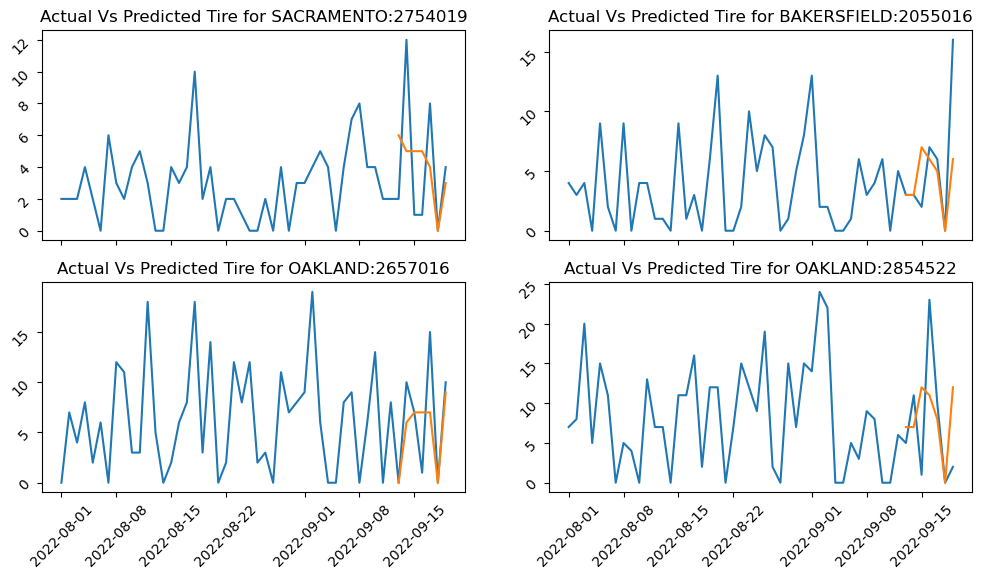

In [27]:
date_plot = pd.Timestamp("2022-08-01")
df_act = data_copy.sample(n=4)[['dc_name','size_code']].reset_index()

fig,ax = plt.subplots(2,2, figsize=(12,6), sharex=True)
c=0
for i in range(0,2):
    for j in range(0,2):
        size_to_plot = df_act.loc[c,'size_code']
        location_to_plot = df_act.loc[c,'dc_name']
        df_pred = data_copy.query(f'size_code=={size_to_plot} and dc_name=="{location_to_plot}" \
                                and date>="{date_plot}"').sort_values(by='date')
        ax[i,j].plot(df_pred.date,df_pred.total_tires)
        ax[i,j].plot(df_pred.date,df_pred.tire_pred)
        ax[i,j].set_title(f'Actual Vs Predicted Tire for {location_to_plot}:{size_to_plot}')
        #ax[i,j].set_xticklabels(ax[i,j].get_xticklabels(),rotation=45)
        ax[i,j].tick_params(labelrotation=45)
        c+=1

        
fig.show()

### Visualizing all prediction together in one graph to confirm no anomalies present in any cases
- The following graphs shows that our model has not done bad in predicting trend over the next week. But the model can definitely do better. The following graph is all the hold-out data together for different locations and different size codes.

Text(0.5, 1.0, 'Actual Vs Predicted For All Data from 2022-09-13')

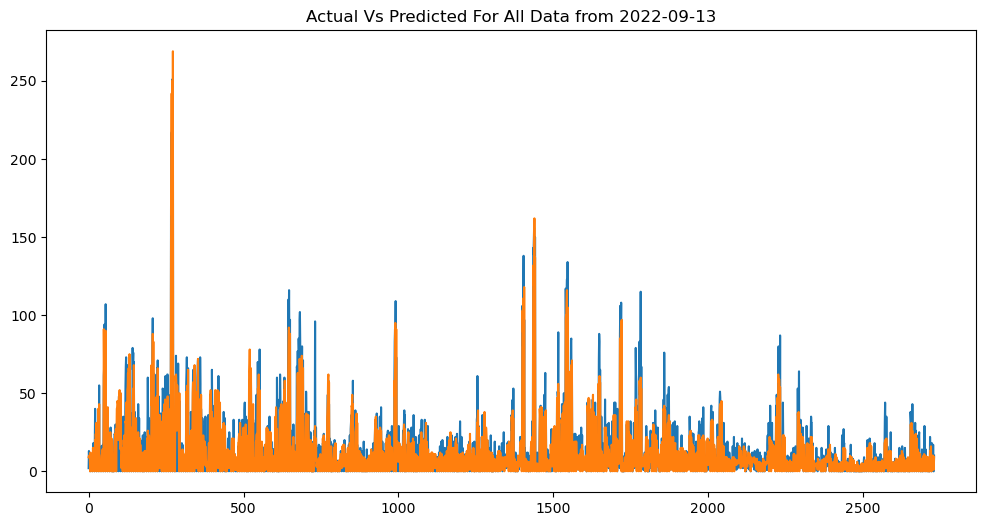

In [28]:
plt.figure(figsize=(12,6))
plt.plot(range(0,len(y_true)),y_true)
plt.plot(range(0,len(y_pred)),y_pred)
plt.title('Actual Vs Predicted For All Data from 2022-09-13')

**Using Mean Absolute Error Percentage Metric, also known as MAPE. MAPE is calculated as it is interprtable and sclae independent. It is also one of the most widely used error metric. The issue of infinity cases has been handled in the code.**

In [29]:
def calculate_mape(y_true, y_pred):
    """Calculates simple wape"""
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    return np.round(abs(y_true - y_pred).mean() / abs(y_true).mean() if abs(y_true).mean() != 0 else np.inf, 5)

In [30]:
calculate_mape(y_true, y_pred)

0.3438

**Note:**<br>
With number of different tests such as Adfullter tests, Trend test it was noticed that different subsets of this time series has different properties. Therefore rather than training the data with only one standard model, we can use different model parameters based on different time-series. This will improve the overall forecasting.
I plan to dig deeper in this and find results.